In [1]:
%pylab inline
from astropy.io import fits
import os

Populating the interactive namespace from numpy and matplotlib


#Supernova

In [12]:
path = '../../data_marcosmo/aligned/supernova_subtract/'
path_imagenes = '../imagenes_alineadas/visitas/'
visitas = sort(os.listdir(path))

In [13]:
print visitas

['+1.fits' '+3.fits' '-1,2.fits' '-2,2.fits' '-3.fits' '-4.fits' '0.fits']


In [18]:
vmins = [5.7,7,6.1,6,11.5,10.9,9.2]
vmaxs = [7.4,9.2,7.9,7.6,13.8,13.3,11.3]

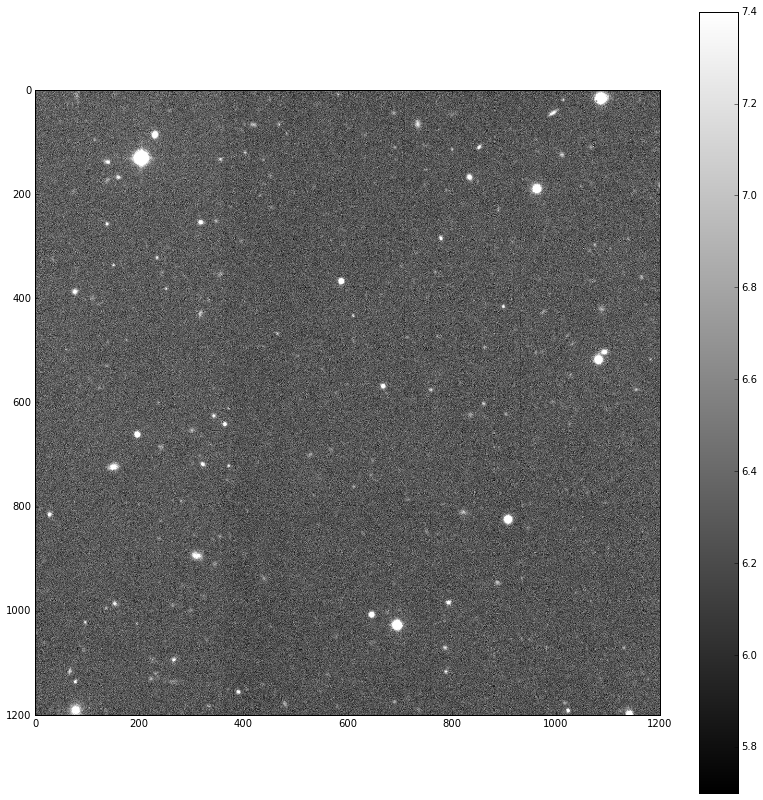

391.981
6.32587


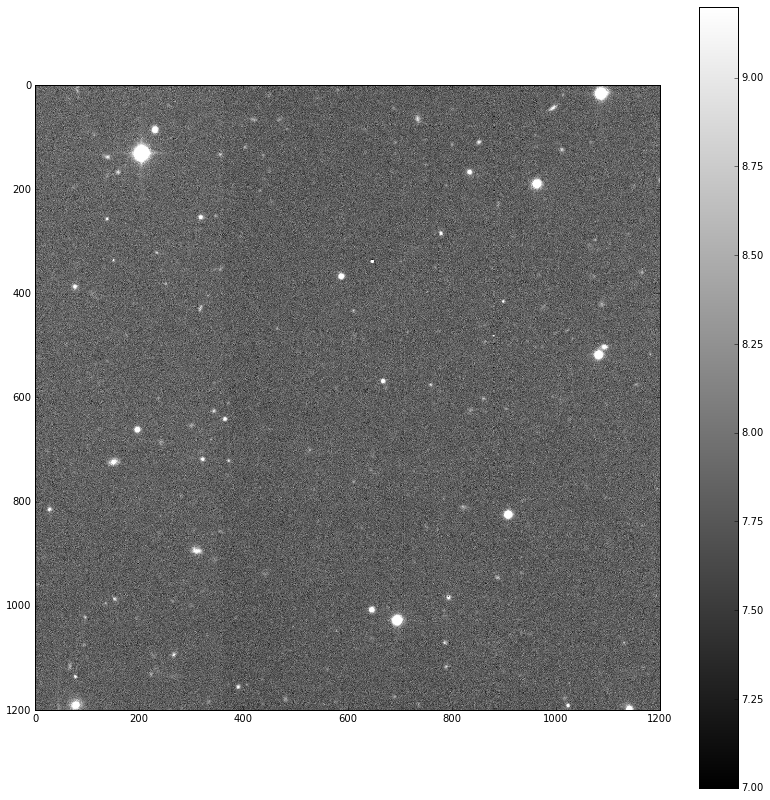

534.018
7.86656


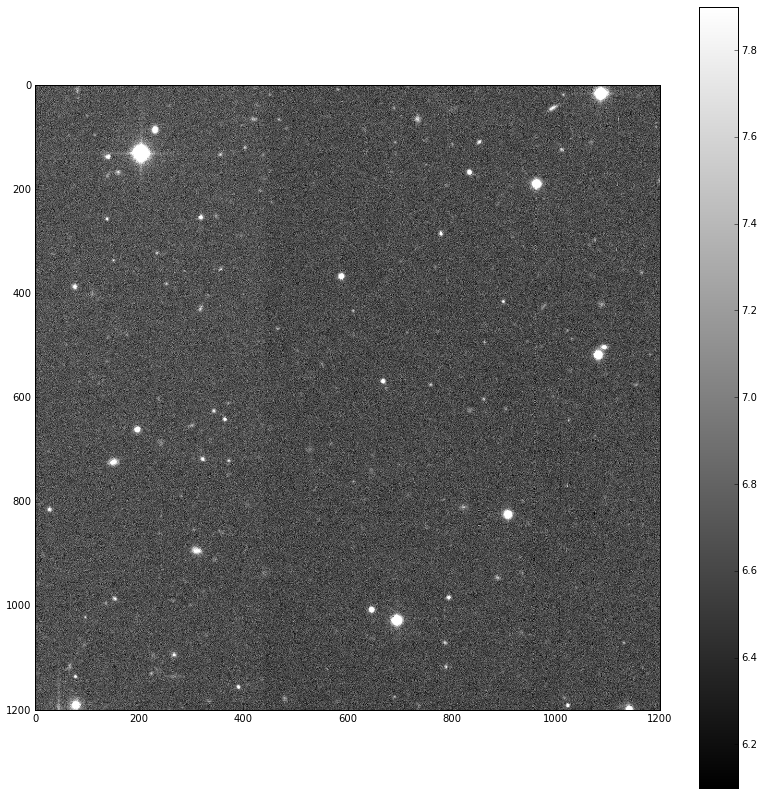

430.49
6.68397


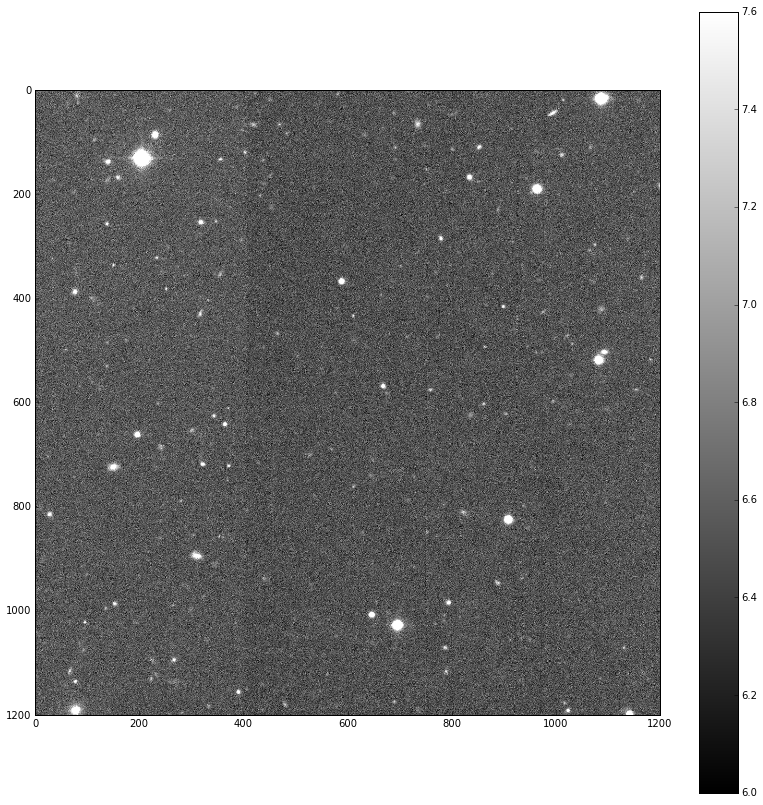

473.815
6.56938


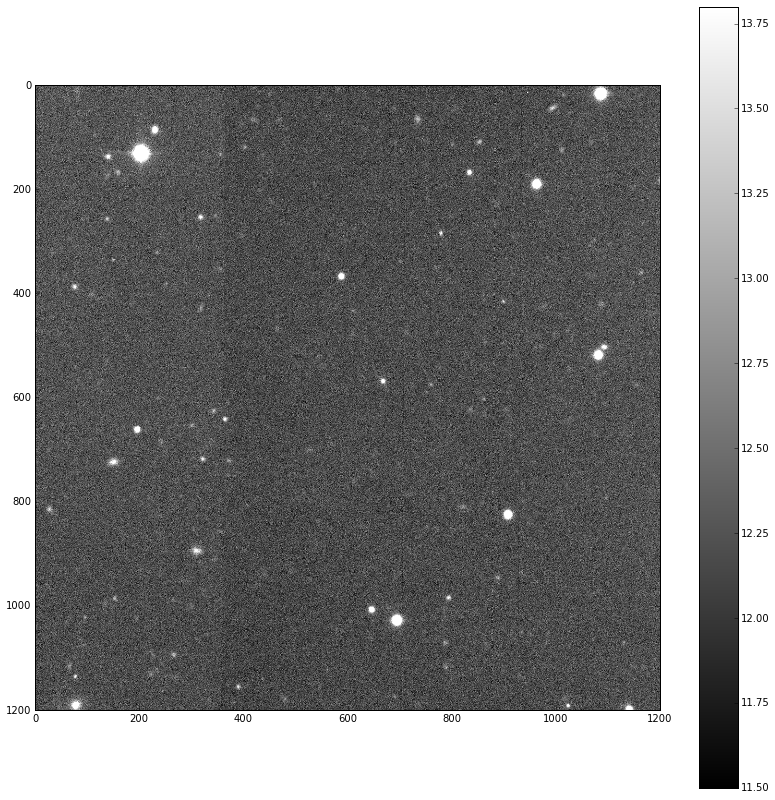

603.899
12.252


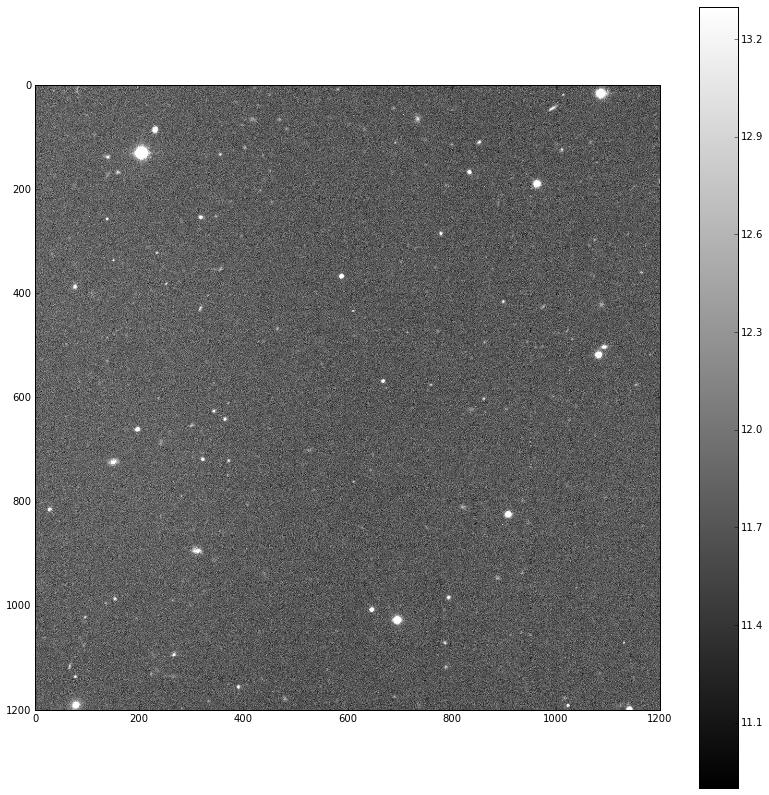

412.357
11.7884


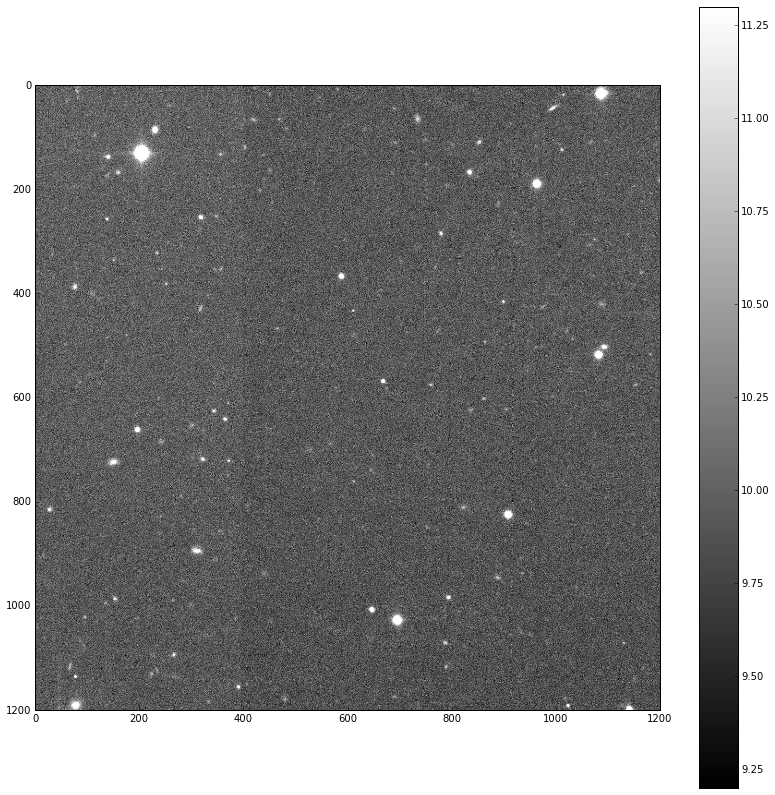

553.921
9.96604


In [19]:
for i in range(len(visitas)): 
    
    vis_fname = visitas[i]
    visita = fits.open(path+vis_fname)

    ccd14 = visita[1].data
        
    fig = figure(figsize=(14,14))
    imshow(ccd14, cmap='gray',vmin=vmins[i],vmax=vmaxs[i])
    colorbar()
    savefig(path_imagenes+vis_fname.split('.')[0]+'.png', bbox_inches='tight')
    show()
    close()
    
    print amax(ccd14)
    print average(ccd14)
    
    visita.close()

In [20]:
shape_ccd14 = shape(ccd14)
print shape_ccd14

(1200, 1200)


#SUSTRACCION IMAGEN-COADICION

In [21]:
path_imagenes = '../imagenes_alineadas/sustraccion_coadicion/'

In [31]:
maximo_para_normalizar = 0.0
coadicion = zeros((shape_ccd14[0], shape_ccd14[1]))

for v in visitas[:-1]: 
    
    visita = fits.open(path+v)

    ccd14 = visita[1].data
    maximo_ccd14 = amax(ccd14)
    
    if(maximo_ccd14 > maximo_para_normalizar):
        maximo_para_normalizar = maximo_ccd14
        
    coadicion = coadicion + ccd14
    
    visita.close()
    
coadicion = coadicion*maximo_para_normalizar/amax(coadicion)
hdu = fits.PrimaryHDU(coadicion)
hdu.writeto(path_imagenes+'coadicion.fits')

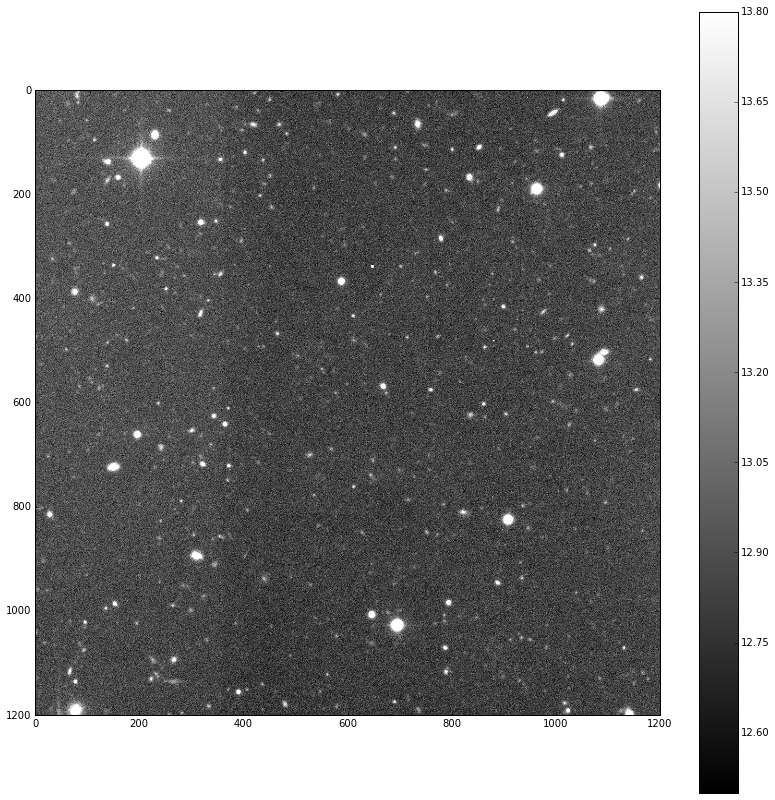

In [32]:
fig = figure(figsize=(14,14))
imshow(coadicion, cmap='gray',vmin=12.5,vmax=13.8)
colorbar()
savefig(path_imagenes+'coadicion.png', bbox_inches='tight')
show()
close()

In [35]:
#Supernova
    
visita = fits.open(path+visitas[-1])

ccd14 = visita[1].data
ccd14 = ccd14*maximo_para_normalizar/amax(ccd14)

sustraccion_coadicion = ccd14 - coadicion

hdu = fits.PrimaryHDU(sustraccion_coadicion)
hdu.writeto(path_imagenes+'sustraccion_coadicion.fits')

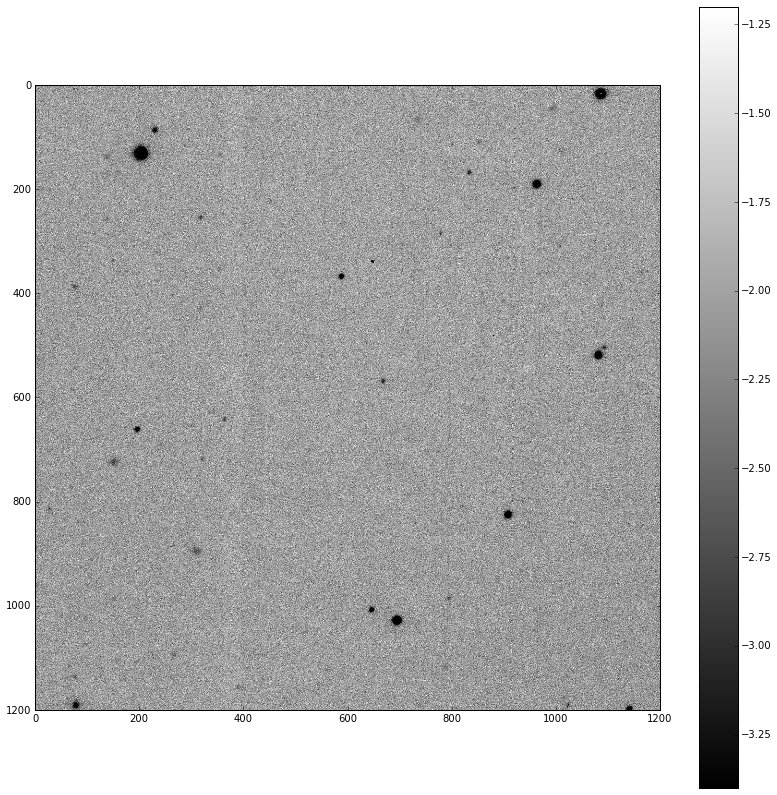

In [36]:
fig = figure(figsize=(14,14))
imshow(sustraccion_coadicion, cmap='gray',vmin=-3.4,vmax=-1.2)
colorbar()
savefig(path_imagenes+'sustraccion_coadicion.png', bbox_inches='tight')
show()
close()

visita.close()

#SUSTRACCION 4D 

In [37]:
path_imagenes = '../imagenes_alineadas/sustraccion_4D/'

In [39]:
num_visitas = len(visitas)

minimos = ones((shape_ccd14[0], shape_ccd14[1]))*inf
maximos = zeros((shape_ccd14[0], shape_ccd14[1]))

In [45]:
for v in visitas:
            
    visita = fits.open(path+v)
    ccd14 = visita[1].data
    ccd14 = ccd14*6000/amax(ccd14) #Normalizando, no estoy segura si debería ir ahi
    
    for fila in range(shape_ccd14[0]):
        for columna in range(shape_ccd14[1]):
            
            pixel = ccd14[fila][columna]
            
            if (pixel < minimos[fila][columna]):
                minimos[fila][columna] = pixel
            
            if (pixel > maximos[fila][columna]):
                maximos[fila][columna] = pixel

    visita.close()

In [46]:
sustraccion4D = maximos-minimos

In [47]:
hdu = fits.PrimaryHDU(sustraccion4D)
hdu.writeto(path_imagenes+'sustraccion_4D.fits')

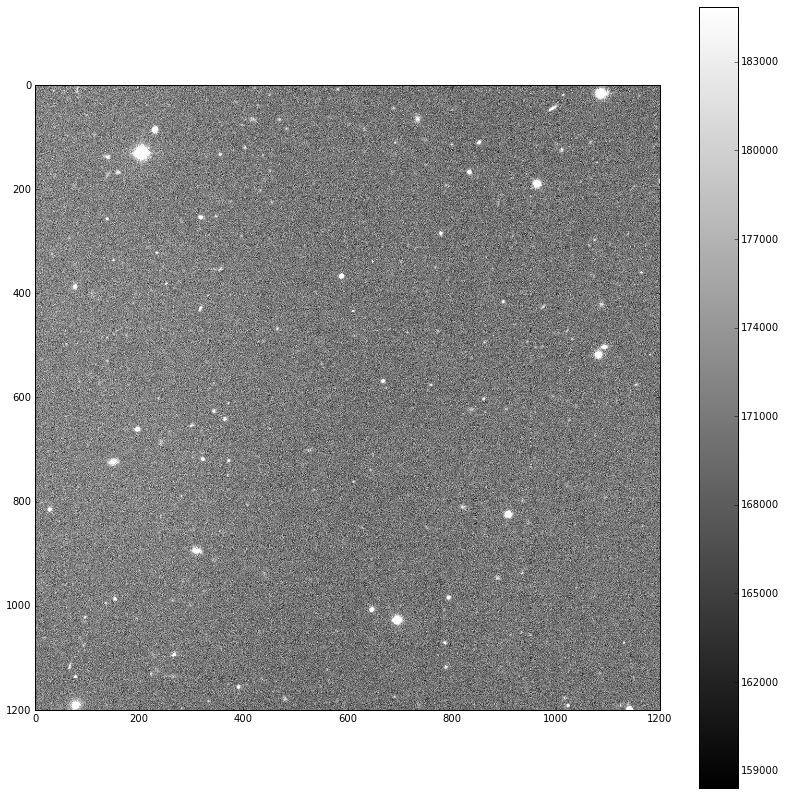

In [48]:
fig = figure(figsize=(14,14))
imshow(sustraccion4D, cmap='gray',vmin=158421,vmax=184870)
colorbar()
savefig(path_imagenes+'sustraccion4D.png', bbox_inches='tight')
show()
close()